## 스테이트 팜 산만한 운전자 감지 경진대회

### 이미지 안의 운전자가 어떤 자세를 취하고 있는지 예측
- c0 : 안전운전 / c1 : 오른손으로 문자 / c2:오른손으로 전화 / c3:왼손으로 문자 / c4:왼손으로 전화 / c5:라디오조작 / c6 : 음료수 섭취
- c7 : 뒷자석에 손 뻗기 / c8 : 얼굴, 머리 만지기 / c9 : 조수석과 대화

### 평가 척도 : 다중 클래스 로그 손실 사용
- 로그 손실 함수를 사용한다는 것은 확률이 높은 틀린 후보에 대하여 강력한 패널티를 부여하곗다는 것을 의미
- 높은 정확률 보다, 높은 확률로 틀리는 경우를 최소화 하고자 하는 것을 짐작 할 수 잇음.

### 전이학습
- ImageNet의 기학습된 모델 파라미터를 사용하여 새로운 모델을 학습하는 방법
- 데이터 전처리는 ImageDataGenerator()를 사용 (실시간으로 미니배치 생성)
- 모든 훈련 데이터를 메모리에 로딩할 경우 장비부하가 높을 수 있기에 학습에 필요한 미니배치 만큼의 이미지 데이터만 실시간으로 읽어옴.

### 데이터 어그멘테이션
- 이미지 전환 (세로, 가로) / 이미지 크롭 / 이미지 회전 / 이미지 이동 / 이미지 색감 조정 등이 있지만 해당 과제에서는 이미지 회전, 이동, 크롭 기법 사용

### Baseline 모델 구축과정
- (1) CNN 모델 정의 
- (2) 데이터 전처리
- (3) 교차 검증 평가 준비
- (4) 모델 학습
- (5) 테스트 데이터 예측 및 캐글 업로드

### 모델 특징
- 원래 이미지 480x640x3 -> input_shape = (224,224,3)

### 교차검증
- 교차 검증 전략은 단순 랜덤 교차 검증을 사용
- 원본이미지는 480x640 -> 112x112로 축소 (원래는 224x224) 
- 26명의 운전자의 이미지 데이터가 훈련 데이터로 제공되고, 그 외 새로운 운전자 n명의 이미지 데이터가 포함된 테스트 데이터로 제공됨.
- 교차검증 수행시 모델이 운전자 고유의 특징(옷 색깔, 피부색, 운전 자세와 상관없는 운전자특징)을 학습하지 않도록 해야함
- 따라서 훈련데이터를 단순 랜덤분류가 아닌 운전자별로 각각 분리 진행


In [4]:
import cv2
import matplotlib.pyplot as plt
def read_image(path):
    # Opencv는 이미지 데이터를 BGR로 읽어오기 때문에
    # cv2.cvtColor 함수를 통해 RGB로 변경한다.
    image = cv2.imread(path, cv2.IMREAD_COLOR)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image

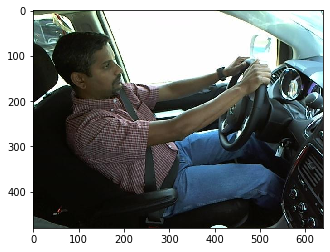

In [6]:
# 1-1. 시각화로 데이터 살펴보기
import os
from glob import glob

data_dir = 'C:/Users/urse/Desktop/dataset/state-farm-distracted-driver-detection/sample_imgs/'
full_data_dir = 'C:/Users/urse/Desktop/dataset/state-farm-distracted-driver-detection/imgs/'
train_path = data_dir + 'train/'
test_path = data_dir + 'test/'
filename = 'c0/img_34.jpg'

image = read_image(train_path + filename)

# 이미지 시각화
plt.imshow(image)

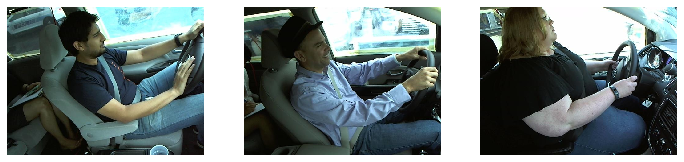

				# c0 : 안전 운전


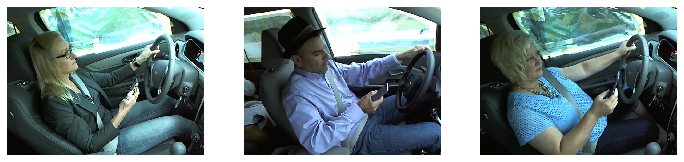

				# c1 : 오른손으로 문자


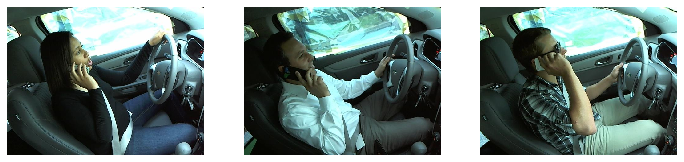

				# c2 : 오른손으로 전화


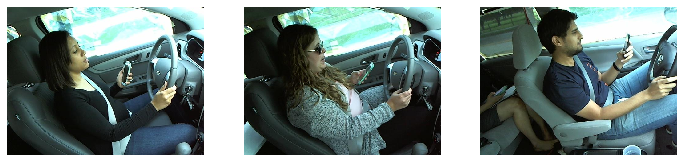

				# c3 : 왼손으로 문자


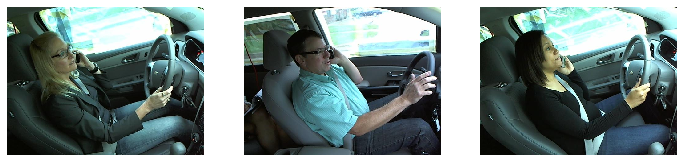

				# c4 : 왼손으로 전화


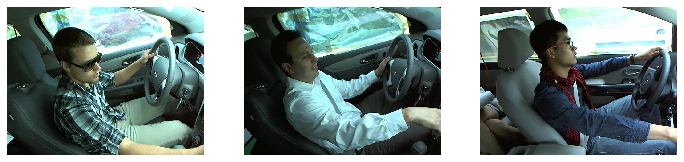

				# c5 : 라디오 조작


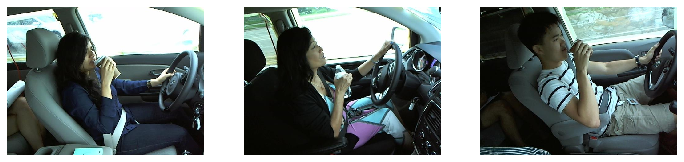

				# c6 : 음료수 섭취


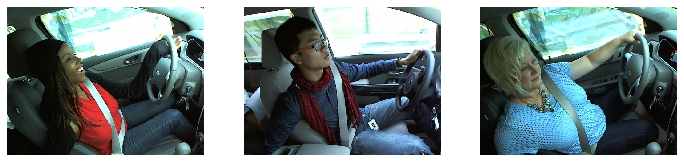

				# c7 : 뒷자석에 손 뻗기


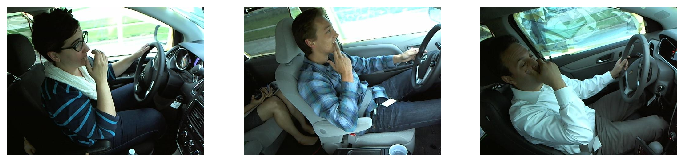

				# c8 : 얼굴, 머리 만지기


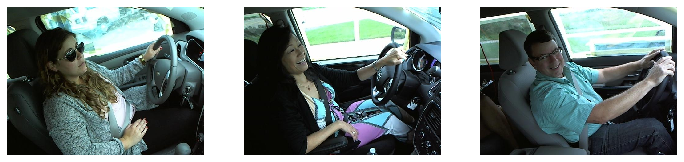

				# c9 : 조수석과 대화


In [7]:
# 1-2. 훈련 데이터 클래스별 예시를 시각화한다
labels = ['c0', 'c1', 'c2', 'c3', 'c4', 'c5', 'c6', 'c7', 'c8', 'c9']
col_to_kor = {
    'c0': '안전 운전',
    'c1': '오른손으로 문자',
    'c2': '오른손으로 전화',
    'c3': '왼손으로 문자',
    'c4': '왼손으로 전화',
    'c5': '라디오 조작',
    'c6': '음료수 섭취',
    'c7': '뒷자석에 손 뻗기',
    'c8': '얼굴, 머리 만지기',
    'c9': '조수석과 대화',
}
for label in labels:
    f, ax = plt.subplots(figsize=(12, 10))
#    files = glob('{}/train/{}/*.jpg'.format(data_dir, label))
    files = glob('{}/{}/*.jpg'.format(train_path, label))
    
    # 각각 총 3개의 이미지씩 시각화한다
    for x in range(3):
        plt.subplot(1, 3, x+1)
        image = read_image(files[x])
        plt.imshow(image)
        plt.axis('off')
    plt.show()
    print('\t\t\t\t# {} : {}'.format(label, col_to_kor[label]))

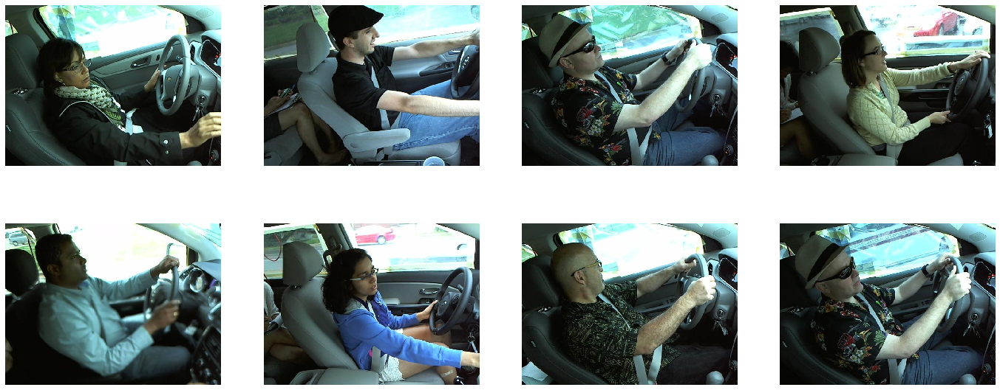

In [19]:
# 1-3. 테스트 데이터 시각화
f, ax = plt.subplots(figsize=(24, 10))
files = glob('{}/*.jpg'.format(test_path))

# 총 8개의 이미지를 시각화
for x in range(8):
    plt.subplot(2,4, x+1)
    image = read_image(files[x])
    plt.imshow(image)
    plt.axis('off')
    
# 데이터 결과 : 카메라의 위치, 성별, 나이, 옷차림, 조명의 밝기 등 이미지의 다양성이 높음. 
# 훈련 데이터의 이미지들에 과적합하지 않고, 일반화 할 수 있는 피처들을 딥러닝 모델이 잘 학습하도록 하는 것이 이번 경진대회의 핵심

In [8]:
# 운전자 메타 데이터
# driver_imgs_list.csv 파일을 통해 제공됨.
# 26명의 운전자에 평균 인당 860장 가량의 훈련데이터 제공. 
# 클래스 별로는 평균 인당 86장 가량의 데이터 제공
import pandas as pd

driver_list = pd.read_csv('C:/Users/urse/Desktop/dataset/state-farm-distracted-driver-detection/driver_imgs_list.csv')

# 파일의 첫 5줄 출력
driver_list.head()

# 1-4. 운전자 ID 고유값의 갯수를 구하기
import numpy as np
#id_num = len(np.unique(driver_list['subject']).tolist())
for col in driver_list.columns:
    col_num = len(np.unique(driver_list[col]).tolist())
    print(col, ' 고윳값 갯수 ', col_num)

subject  고윳값 갯수  26
classname  고윳값 갯수  10
img  고윳값 갯수  22424


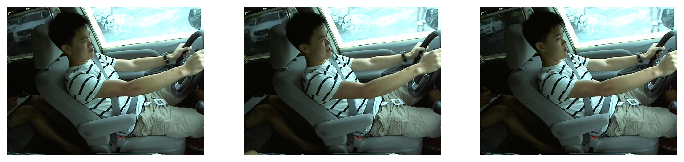

				# 운전자 : p002 | 클래스 : "c0 : 안전 운전"


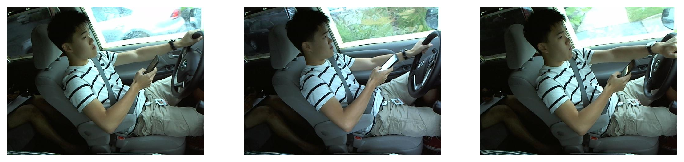

				# 운전자 : p002 | 클래스 : "c1 : 오른손으로 문자"


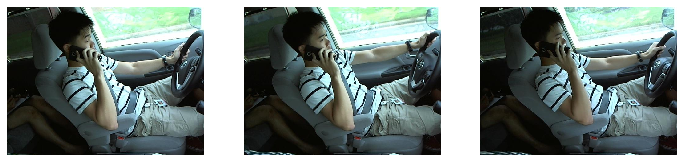

				# 운전자 : p002 | 클래스 : "c2 : 오른손으로 전화"


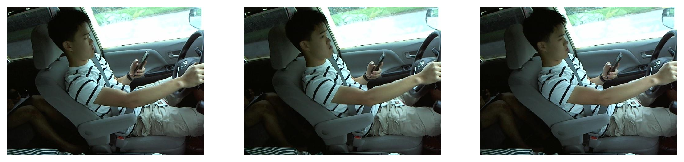

				# 운전자 : p002 | 클래스 : "c3 : 왼손으로 문자"


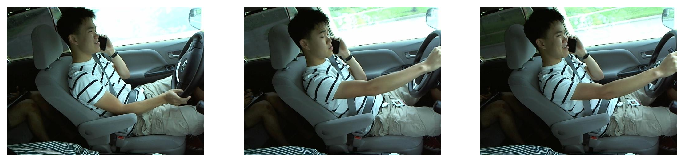

				# 운전자 : p002 | 클래스 : "c4 : 왼손으로 전화"


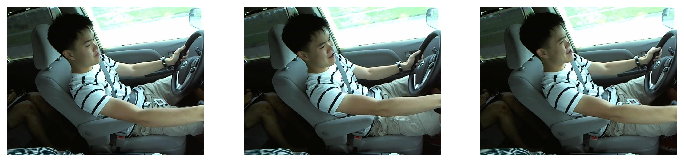

				# 운전자 : p002 | 클래스 : "c5 : 라디오 조작"


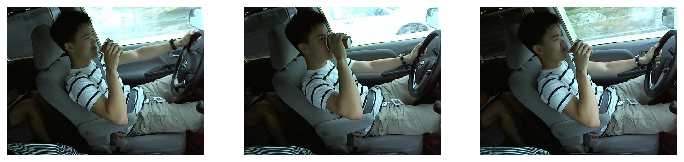

				# 운전자 : p002 | 클래스 : "c6 : 음료수 섭취"


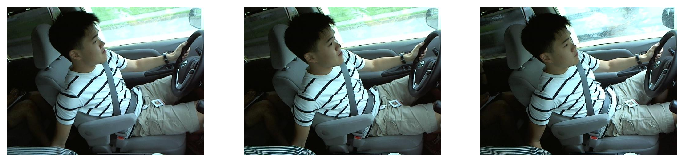

				# 운전자 : p002 | 클래스 : "c7 : 뒷자석에 손 뻗기"


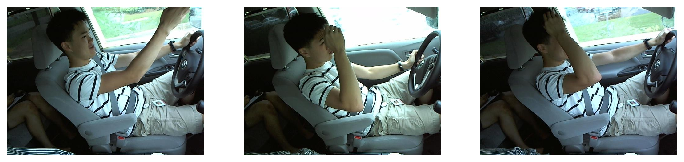

				# 운전자 : p002 | 클래스 : "c8 : 얼굴, 머리 만지기"


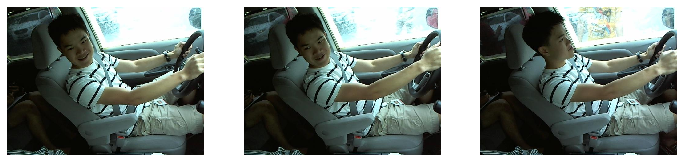

				# 운전자 : p002 | 클래스 : "c9 : 조수석과 대화"


In [9]:
# 총 26명의 운전자별 10개의 클래스에 대한 샘플 이미지를 볼 수 있다.
# 이미지를 사람별로 구분함..!!!!!
driver_to_img = {}

# 1-5.운전자별 이미지 데이터를 저장하는 dict를 생성함.
# i는 그냥 number , row는 행 1줄씩
for i, row in driver_list.iterrows():
    driver = row['subject'] # p002, p003, p004 등 26명
    label = row['classname'] # c0, c1, c2, c3, c4 ... 등 9개
    image_path = row['img'] # img_44733.jpg, img_72999.jpg 등
    
    # 해당 사람 이 없으면 딕셔너리에 해당 사람 추가
    if not driver_to_img.get(driver, False):
        driver_to_img[driver] = [image_path]
    
    # 해당 사람 있으면 그 사람항목에 추가.
    else:
        driver_to_img.get(driver).append(image_path)

# 1-6. 운전자별 훈련 데이터 예시 를 시각화
for driver in np.unique(driver_list['subject']).tolist():
    # driver : p002, p003, p004, p005
    
    for label in labels:
        f, ax = plt.subplots(figsize=(12, 10))
        files = glob('{}/train/{}/*.jpg'.format(full_data_dir, label))
        print_files = []
        
        for fl in files:
            if (driver_list[driver_list['img'] == os.path.basename(fl)]['subject'] == driver).values[0]:
                print_files.append(fl)
    
        # 총 3개의 이미지를 시각화한다
        for x in range(3):
            plt.subplot(1, 3, x+1)
            image = read_image(print_files[x])
            plt.imshow(image)
            plt.axis('off')
        plt.show()
        
        # 운전자 ID와 클래스를 출력한다
        print('\t\t\t\t# 운전자 : {} | 클래스 : "{} : {}"'.format(driver, label, col_to_kor[label]))
        
    # 운전자 1명에 대해서만 시각화한다. break 없애면 26명 확인 가능.
    break

# "c0 : 안전 운전" Outliers


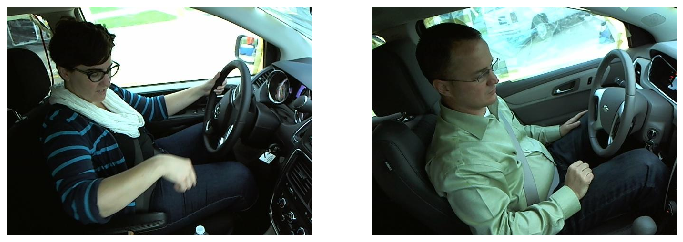

# "c3: 왼손으로 문자" Outliers


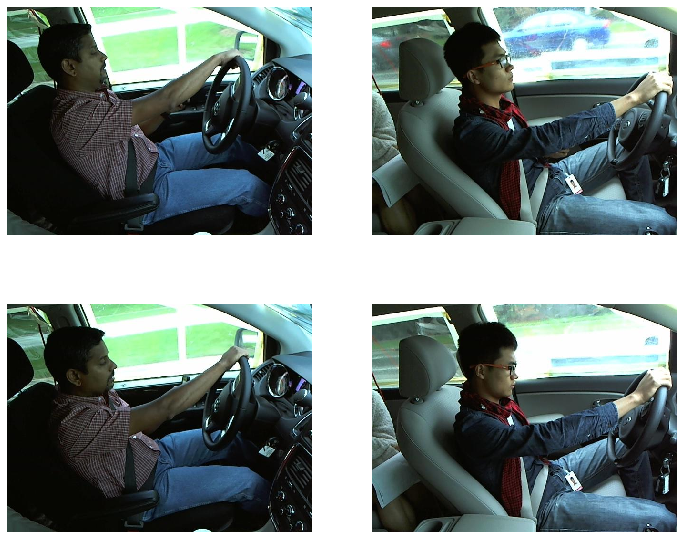

# "c4: 왼손으로 전화" Outliers


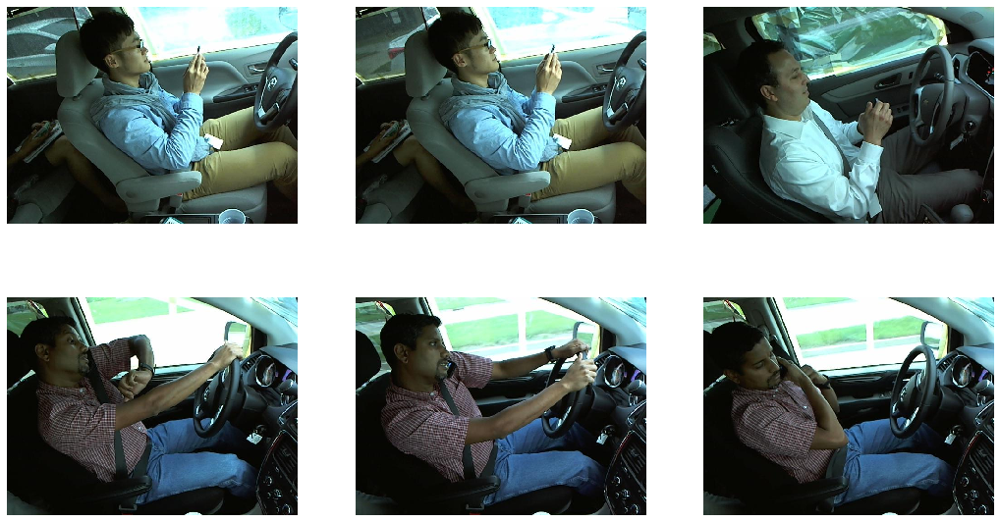

# "c9: 조수석과 대화" Outliers


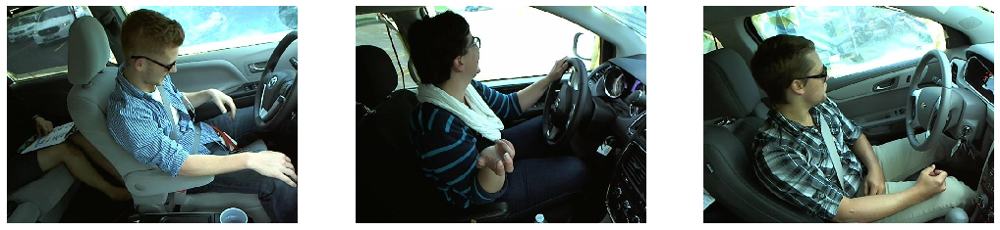

In [14]:
# outliers 들 시각화하기
# 1-7. 훈련 데이터 중 특이한 데이터를 시각화한다

# Label : c0 안전 운전
# 양손으로 핸들을 쥐어야 하는데 쥐고 있찌 않으며, 정면을 응시하고 있지도 않음.
label = 'c0'
imgs = [21155, 31121]
print('# "c0 : 안전 운전" Outliers')
f, ax = plt.subplots(figsize=(12, 10))
for x in range(len(imgs)):
    plt.subplot(1, 2, x+1)
    image = read_image('{}train/{}/img_{}.jpg'.format(full_data_dir, label, imgs[x]))
    plt.imshow(image)
    plt.axis('off')
plt.show()

# Label : c3 왼손으로 문자
# 오른손으로 핸들을 잡고 있고 왼손에 잡은 핸드폰이 가려짐
label = 'c3'
imgs = [38563, 45874, 49269, 62784]
print('# "c3: 왼손으로 문자" Outliers')
f, ax = plt.subplots(figsize=(12, 10))
for x in range(len(imgs)):
    plt.subplot(2, 2, x+1)
    image = read_image('{}train/{}/img_{}.jpg'.format(full_data_dir, label, imgs[x]))
    plt.imshow(image)
    plt.axis('off')
plt.show()

# Label : c4 왼손으로 전화
# 왼손이 아닌 오른손에 더 가깝고 양손으로 핸드폰 하는중
# 핸드폰이 가려져 안전운전과 유사해보이기 까지함.
label = 'c4'
imgs = [92769, 38427, 41743, 69998, 77347, 16077]
print('# "c4: 왼손으로 전화" Outliers')
f, ax = plt.subplots(figsize=(18, 10))
for x in range(len(imgs)):
    plt.subplot(2, 3, x+1)
    image = read_image('{}train/{}/img_{}.jpg'.format(full_data_dir, label, imgs[x]))
    plt.imshow(image)
    plt.axis('off')
plt.show()

# Label : c9 조수석과 대화
# 몸을 우측으로 비틀거나 해야되는데 정면을 바라보고 대화를 하고 있고, 입모양만 대화를 하고 있음.
label = 'c9'
imgs = [28068, 37708, 73663]
print('# "c9: 조수석과 대화" Outliers')
f, ax = plt.subplots(figsize=(18, 10))
for x in range(len(imgs)):
    plt.subplot(1, 3, x+1)
    image = read_image('{}train/{}/img_{}.jpg'.format(full_data_dir, label, imgs[x]))
    plt.imshow(image)
    plt.axis('off')
plt.show()

# Examples of c0 : 안전운전 classified in wrong labels


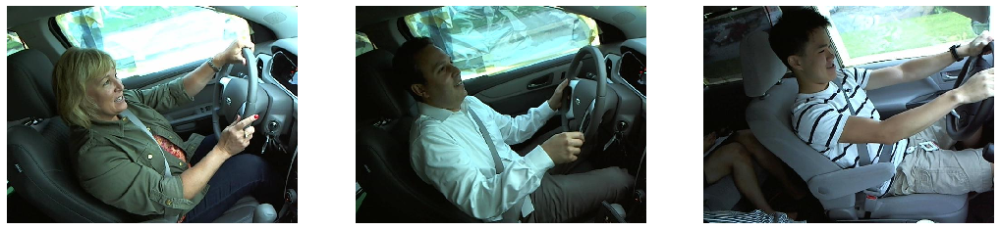

# Examples of c1 : 오른손으로 문자 classified in wrong labels


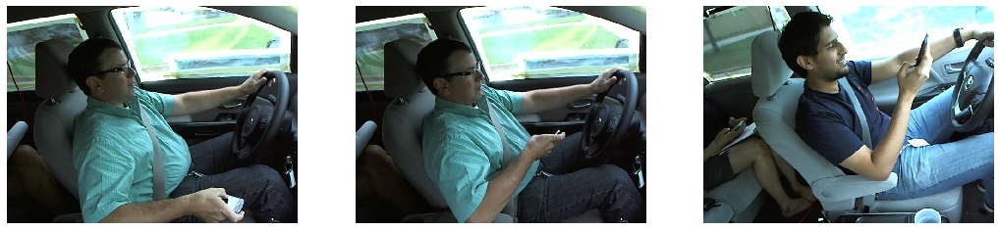

# Examples of c8 : 얼굴, 머리 만지기 classified in wrong labels


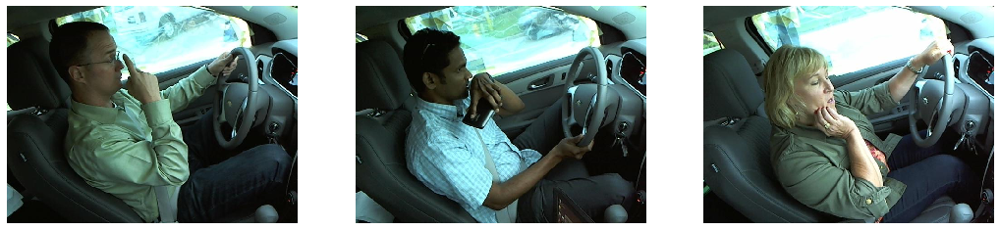

In [17]:
# 1-8. 잘못 분류된 훈련 데이터의 일부를 시각화한다
# 사실상 모든 데이터를 다 눈으로 확인할 수는 없고, 다양한 방법으로 데이터의 노이즈를 찾아내 정제해야 함.

# Real Label : c0
# 안전운전의 모습이지만 c5, c7, c8로 잘못 분류되어 있는 것들
imgs = [('c5', 30288), ('c7', 46617), ('c8', 3835)]
f, ax = plt.subplots(figsize=(18, 10))
print('# Examples of c0 : 안전운전 classified in wrong labels')
for x in range(len(imgs)):
    plt.subplot(1, 3, x+1)
    image = read_image('{}train/{}/img_{}.jpg'.format(full_data_dir, imgs[x][0], imgs[x][1]))
    plt.imshow(image)
    plt.axis('off')
plt.show()

# Real Label : c1
# 오른손으로 문자하는 모습이지만 c0, c0, c2로 잘못 분류되어 있는 것들
imgs = [('c0', 29923), ('c0', 79819), ('c2', 32934)]
f, ax = plt.subplots(figsize=(18, 10))
print('# Examples of c1 : 오른손으로 문자 classified in wrong labels')
for x in range(len(imgs)):
    plt.subplot(1, 3, x+1)
    image = read_image('{}train/{}/img_{}.jpg'.format(full_data_dir, imgs[x][0], imgs[x][1]))
    plt.imshow(image)
    plt.axis('off')
plt.show()

# Real Label : c8
# 얼굴, 머리만지기의 모습이지만 c0, c3, c5로 잘못 분류되어 있는 것들
imgs = [('c0', 34380), ('c3', 423), ('c5', 78504)]
f, ax = plt.subplots(figsize=(18, 10))
print('# Examples of c8 : 얼굴, 머리 만지기 classified in wrong labels')
for x in range(len(imgs)):
    plt.subplot(1, 3, x+1)
    image = read_image('{}train/{}/img_{}.jpg'.format(full_data_dir, imgs[x][0], imgs[x][1]))
    plt.imshow(image)
    plt.axis('off')
plt.show()

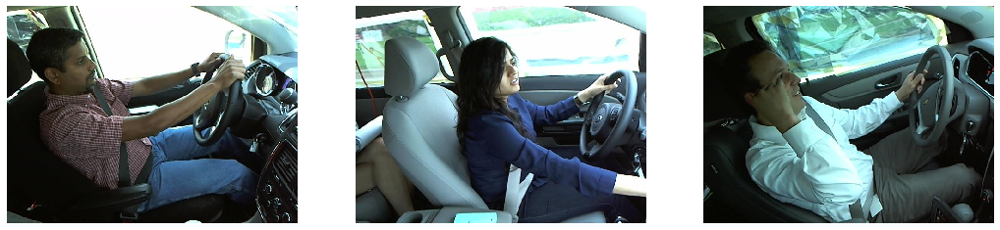

In [31]:
# 1-9. 데이터 어그멘테이션 (Data Augmentation)
# 랜덤한 노이즈를 추가하여 모델이 학습에 사용되는 데이터를 인위적으로 부풀리는 방법
# 이미지 회전, 이미지 이동, 이미지 줌인/줌 아웃, 이미지 합성, 이미지 흐리기 등 가능.

# 정상 이미지 파일 경로를 지정한다
img_path = [('c0', 34), ('c5', 443), ('c8', 798)]

# 이미지를 그대로 읽어온다
imgs = []
for x in range(len(img_path)):
    imgs.append(read_image('{}train/{}/img_{}.jpg'.format(data_dir, img_path[x][0], img_path[x][1])) / 255.)

# 이미지를 시각화한다
f, ax = plt.subplots(figsize=(18, 10))
for i, img in enumerate(imgs):
    plt.subplot(1, 3, i+1)
    plt.imshow(img)
    plt.axis('off')
plt.show()

# 이미지 회전 : -10도
# 이미지 회전 : 12도
# 이미지 회전 : 7도


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


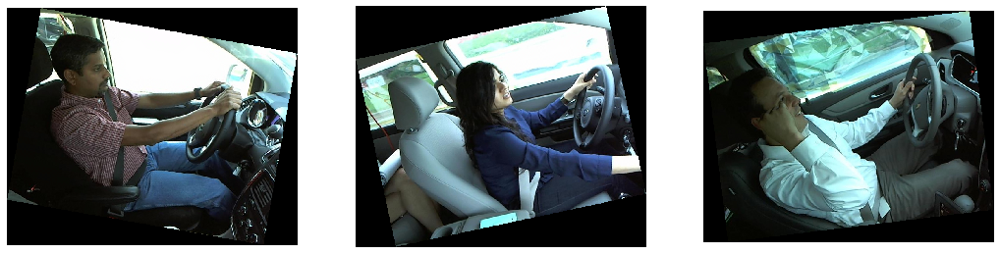

In [32]:
# 첫번쨰 어그멘테이션 (회전 - Rotate)
# -20 ~ 20도 사이의 임의의 각도로 이미지를 회전 scipy.ndimage 의 rotate()함수 사용.
# 이미지의 정보를 잃어버리지 않기 위해 회전된 이미지는 축소되고, 주변 배경은 검은색으로 대체됨.
from scipy.ndimage import rotate
imgs2 = imgs
# 임의의 회전 각도 (rotate_angle)을 구한 후, 이미지를 회전함.
for i, img in enumerate(imgs2):
    rotate_angle = np.random.randint(40) -20 # -20 ~ 20도 사이의 임의의 각도
    print('# 이미지 회전 : {}도'.format(rotate_angle))
    imgs2[i] = rotate(img, rotate_angle)
    
# 이미지 시각화
f, ax = plt.subplots(figsize=(18,10))
for x, img in enumerate(imgs2):
    plt.subplot(1,3,x+1)
    plt.imshow(img)
    plt.axis('off')
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


# 이미지 줌 인 : (x : 0.93, y : 0.8)


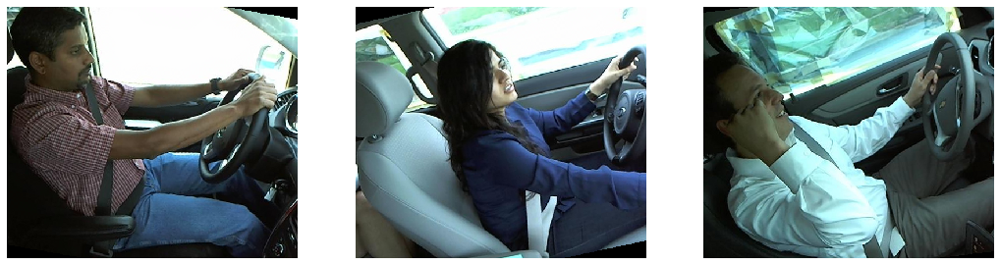

In [33]:
# 두번쨰 어그멘테이션 (확대 - Zoom in)
# 배경의 검은색을 제거하기 위해 Zoom in 함
def crop_center(img, cropx, cropy):
    # 이미지 중간을 Crop하는 함수를 정의한다
    y,x = img.shape
    startx = x//2-(cropx//2)
    starty = y//2-(cropy//2)    
    return img[starty:starty+cropy,startx:startx+cropx]

# x,y 축의 이미지 확대 비율을 랜덤으로 정의한다
# 너무 과학 확대 비율은 이미지 내 중요한 정보를 잃어버릴 수 있고
# 너무 소극적인 확대 비율은 이미지의 다양성을 잃는다.
# 0.8에서 ~ 1.0 사이의 값으로 확대 비율
width_zoom = int(image.shape[0] * (0.8 + 0.2 * (1 - np.random.random())))
height_zoom = int(image.shape[1] * (0.8 + 0.2 * (1 - np.random.random())))

# 이미지를 확대한다
print('# 이미지 줌 인 : (x : {}, y : {})'.format(round(1. * width_zoom / image.shape[0], 2), \
                                            round(1. *height_zoom / image.shape[1],2 )))
for i, img in enumerate(imgs2):
    final_image = np.zeros((width_zoom, height_zoom, 3))
    final_image[:,:,0] = crop_center(img[:,:,0], height_zoom, width_zoom)
    final_image[:,:,1] = crop_center(img[:,:,1], height_zoom, width_zoom)
    final_image[:,:,2] = crop_center(img[:,:,2], height_zoom, width_zoom)
    imgs2[i] = final_image

# 이미지를 시각화한다
f, ax = plt.subplots(figsize=(18, 10))
for x, img in enumerate(imgs2):
    plt.subplot(1, 3, x+1)
    plt.imshow(img)
    plt.axis('off')
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


10x10 커널 크기로 이미지 흐리기


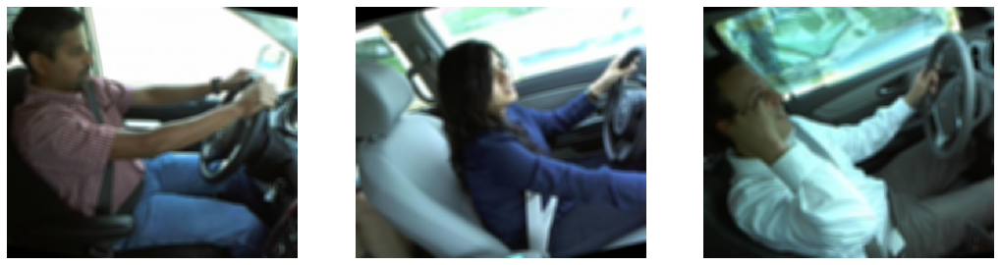

In [34]:
# 세번째 어그멘테이션 이미지 흐리게 만들기
# 여러 방법이 존재하지만 가장 흔히 사용되는 방법은 N크기의 커널에 존재하는 이미지 rgb값을 평균하는 것. 
# 즉 모든 픽셀의 RGB값을 주변 N x N 픽셀의 평균값으로 대체하는 방법이다.
# Opencv의 Blur 방법을 이용한다.

# 10x10 크기의 커널로 이미지를 흐린다
blur_degree = 10
print('{}x{} 커널 크기로 이미지 흐리기'.format(blur_degree, blur_degree))
for i, img in enumerate(imgs):
    imgs2[i] = cv2.blur(img,(blur_degree,blur_degree))

# 이미지를 시각화한다
f, ax = plt.subplots(figsize=(18, 10))
for x, img in enumerate(imgs2):
    plt.subplot(1, 3, x+1)
    plt.imshow(img)
    plt.axis('off')
plt.show()

## 탐색적 데이터 분석 요약
- 총 22,424개의 훈련 이미지는 총 10개의 클래스로 분류되어 있으며, 운전자 26명으로 인해 구축되었다.
- 운전자별 이미지를 시각해본 결과, 클래스별로 운전자들의 이미지가 매우 유사하다는 것을 확인할 수 있었고,
- 스테이트 팜에서 준비한 특수 트랙 상에서 트럭이 끌고가는 차량안에서 촬영된 동영상을 기반으로 이미지 데이터를 구축했다고 함.
-
- 클래스별로 OUTLIER 이미지들을 발견할 수 있었고, 잘못 분류되고 있는 이미지 또한 발견할 수 있었다.
- 부족한 훈련 데이터의 양을 보완하기 위해 Data Augmentation 기법을 사용하였고 이미지 회전, 확대, 흐리기 등의 기법을 사용해 보았다.